In [3]:
import numpy as np
import os
from tqdm import tqdm
import pyarrow as pa
import pylab as plt
import pyarrow.parquet as pq
from glob import glob
import seaborn as sns

In [4]:
FOLDER_SHORT = '/media/alexander/BigDisk/data/selk_strogg_2D_2023_04_30'
FOLDER = '/media/alexander/BigDisk/data/selk_strogg_2D_2023_04_30_long_2'

In [5]:
datas_short = sorted(glob(f'{FOLDER_SHORT}/*/*.parquet'), key = lambda x: float(x.split('_04_30/')[1].split('_')[0]))
datas = sorted(glob(f'{FOLDER}/*/*.parquet'), key = lambda x: float(x.split('long_2/')[1].split('_')[0]))


In [6]:
len(datas), len(datas_short)

(175, 130)

# Пиктограммки

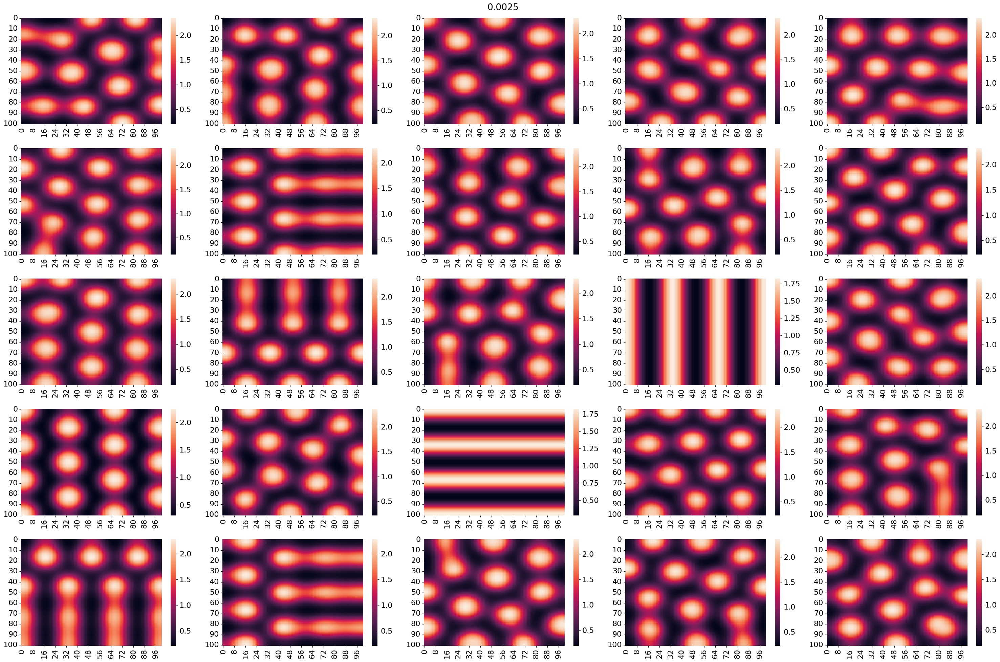

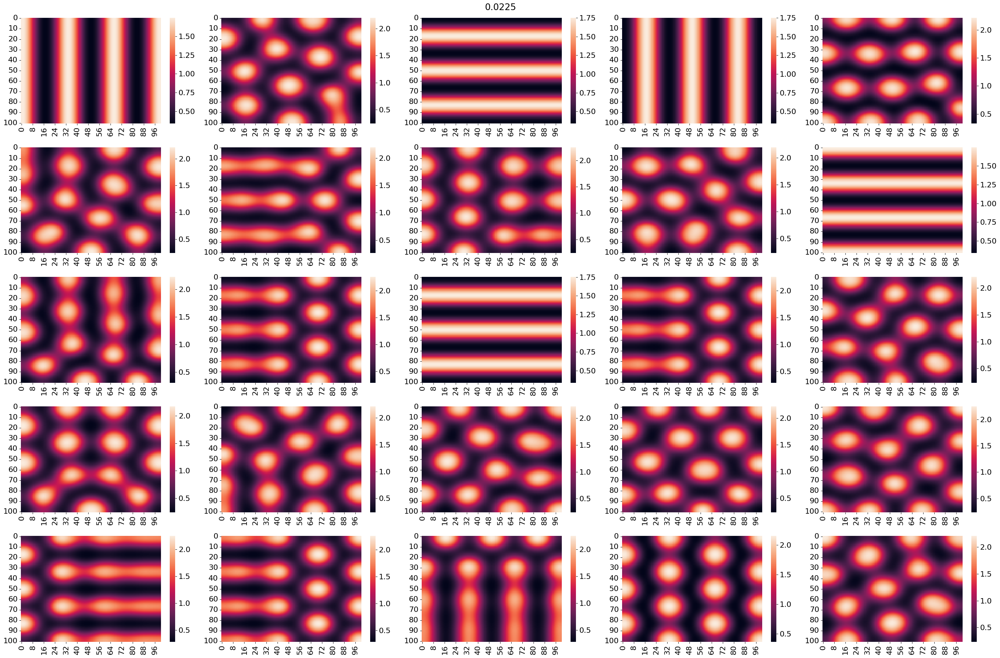

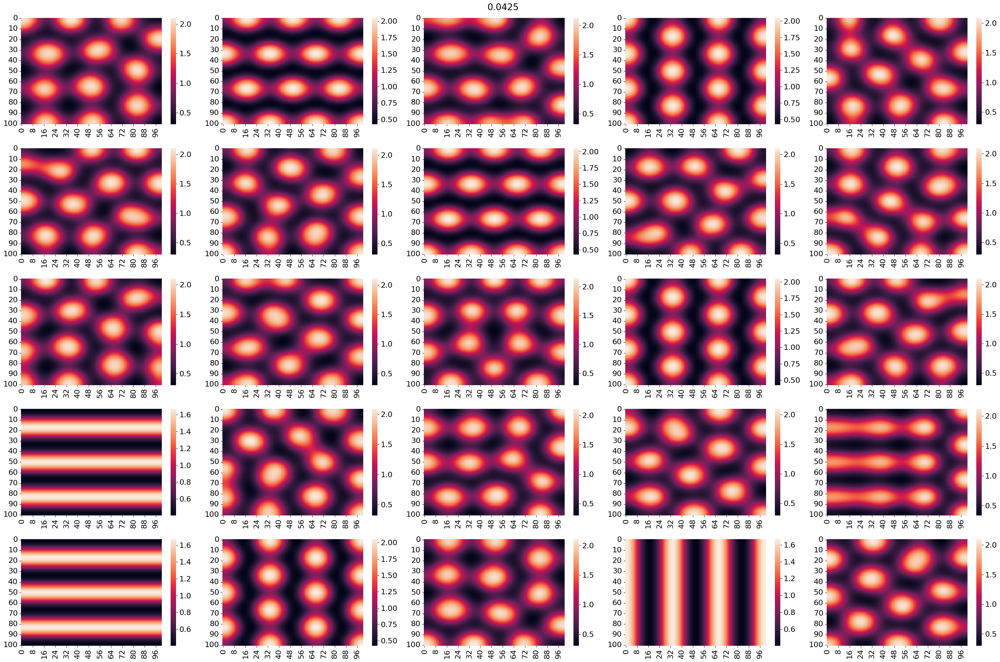

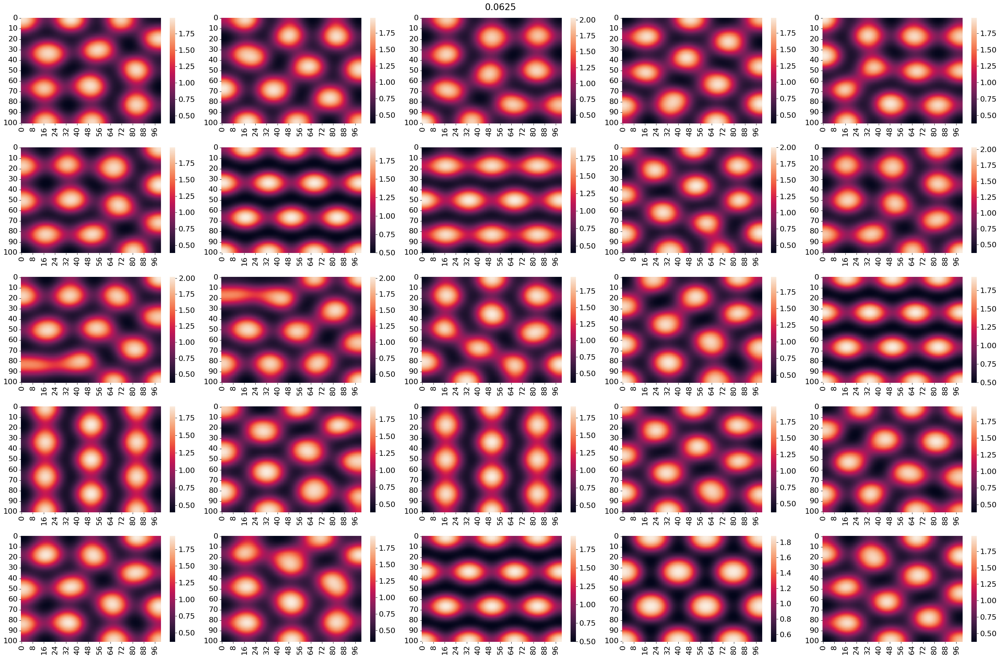

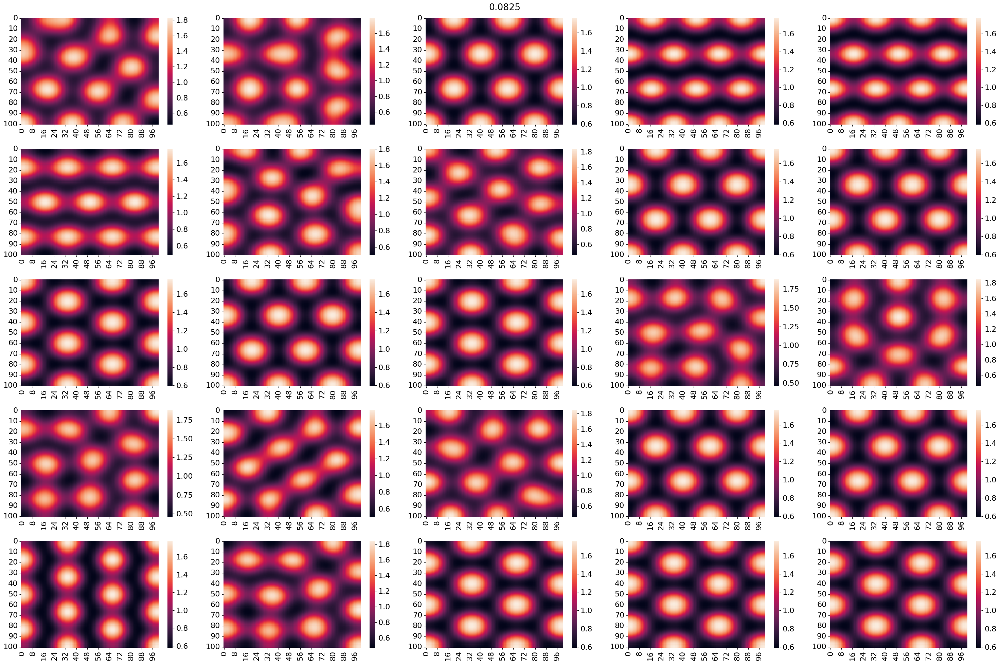

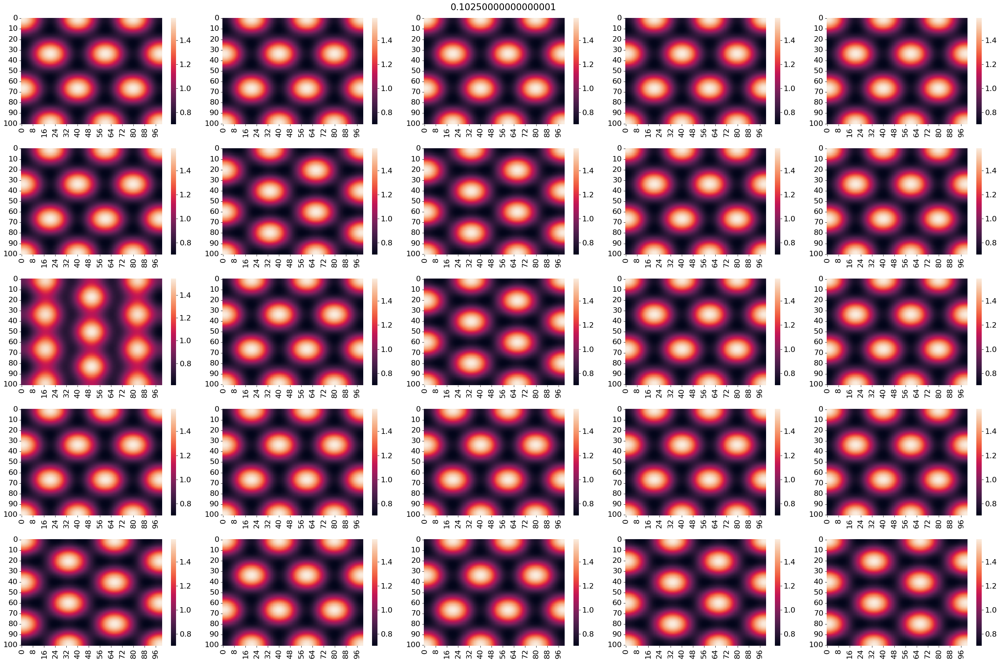

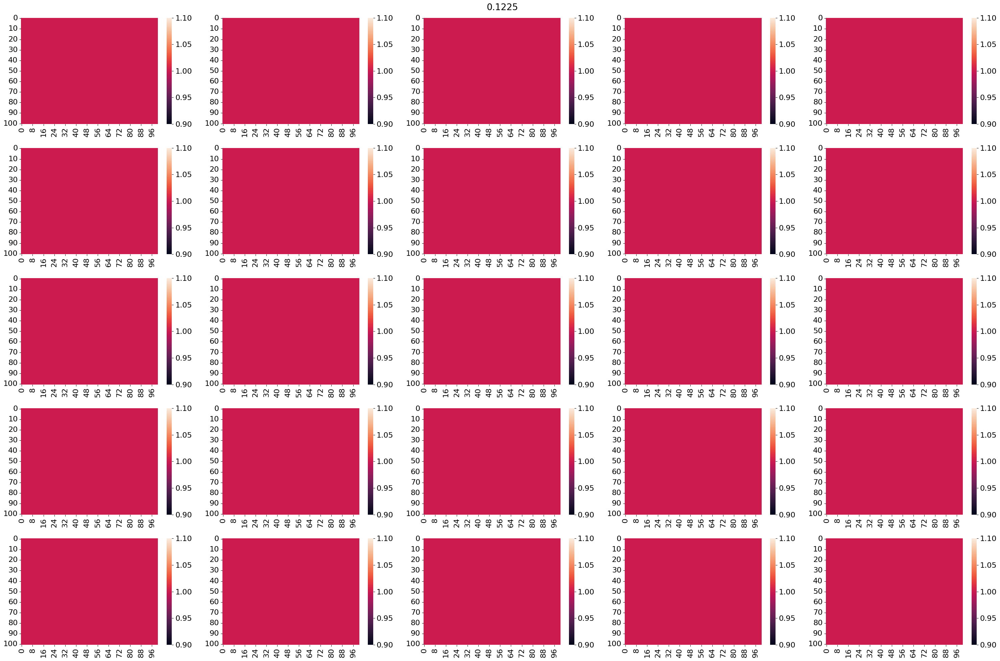

In [87]:
plt.rcParams['font.size'] = 16
for i in range(0,7):
    current_data = datas[i*25: (i+1)*25]
    fig, axes = plt.subplots(5,5,figsize=(30,20))
    for data,ax in zip(current_data, axes.flatten()):
        data = pq.read_table(data)['u'].to_numpy().reshape((-1,101,101))
        sns.heatmap(data[-1], ax=ax)
    plt.suptitle(i*0.02+0.0025)
    plt.tight_layout()
    plt.show()

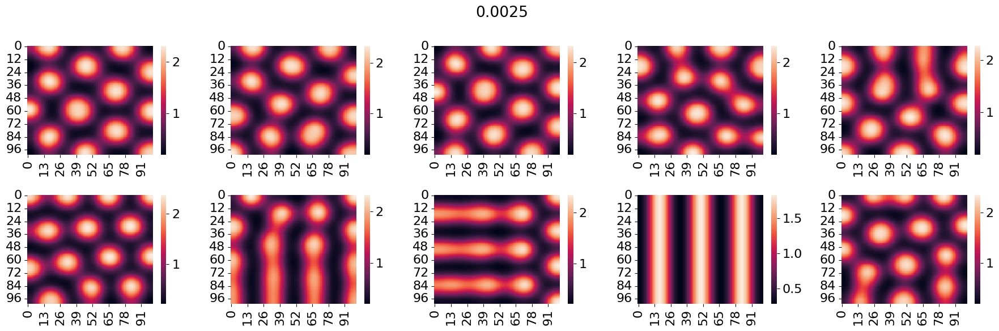

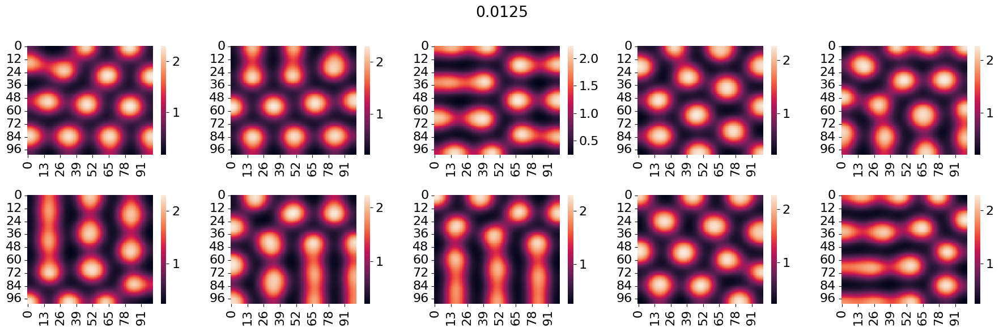

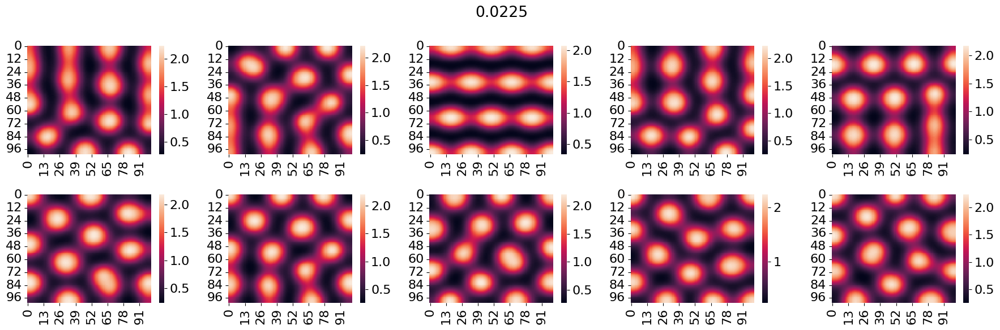

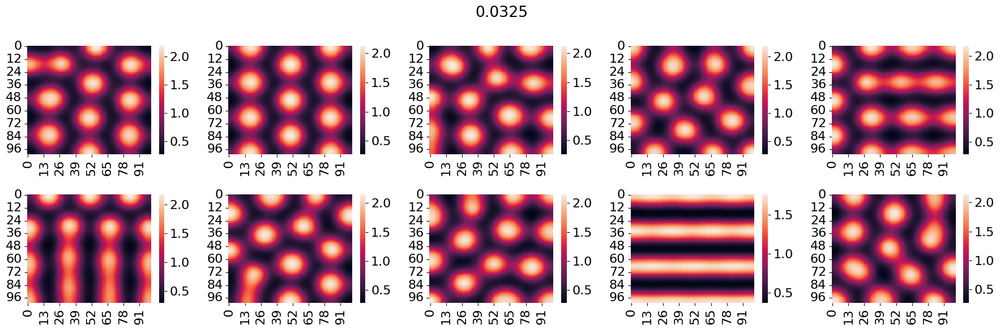

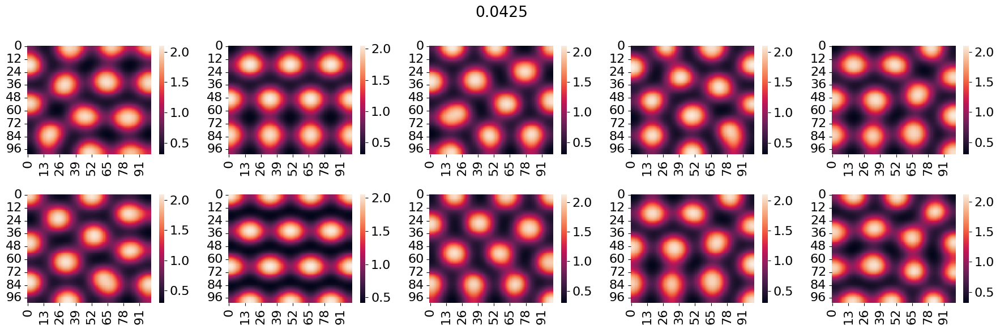

...

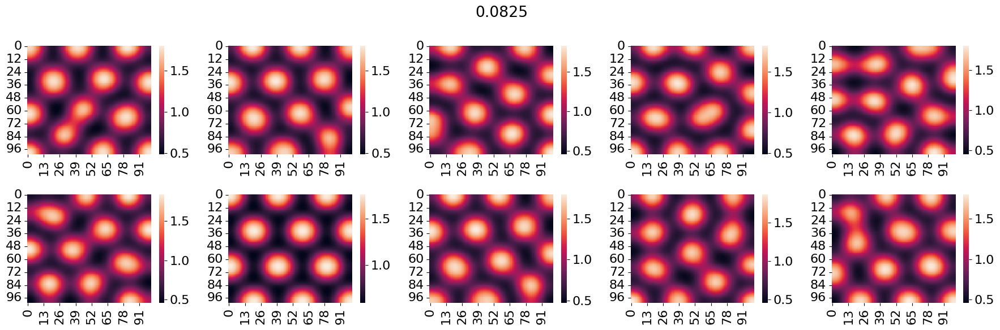

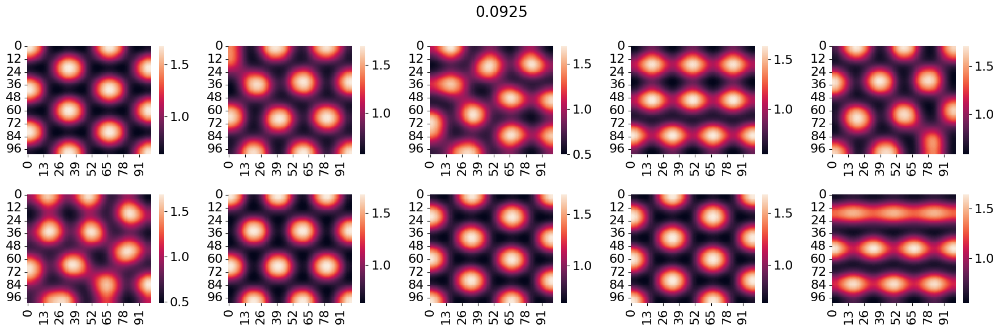

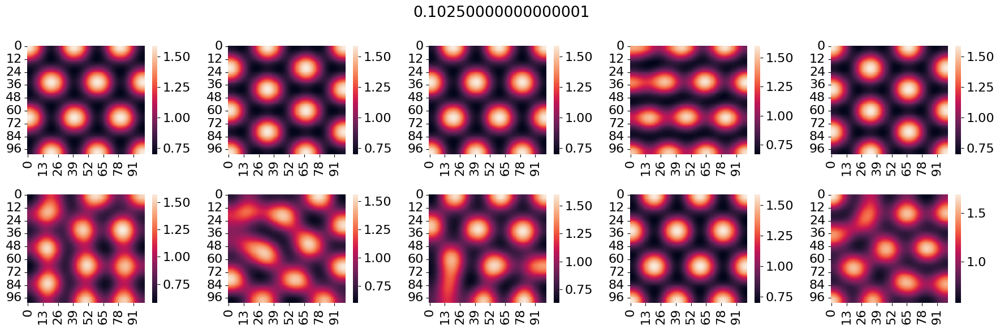

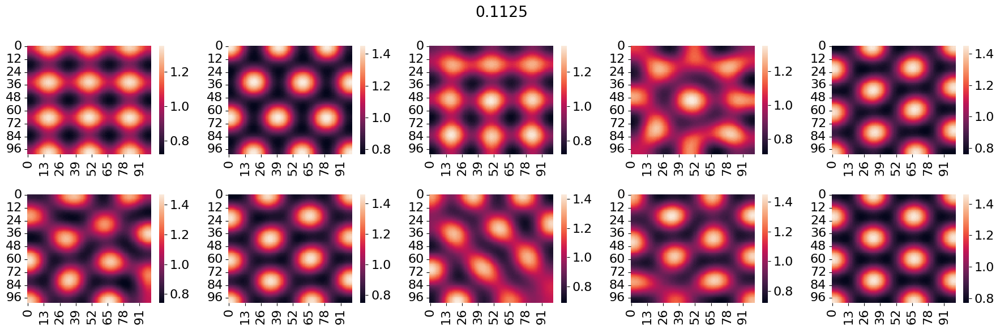

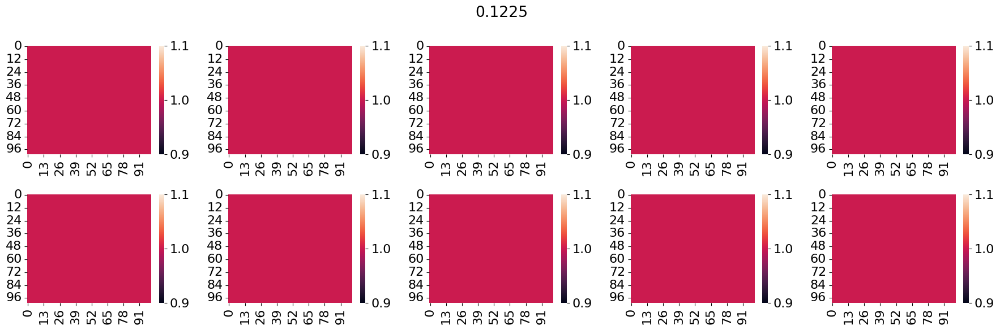

In [93]:
plt.rcParams['font.size'] = 16
for i in range(0,13):
    current_data = datas_short[i*10: (i+1)*10]
    fig, axes = plt.subplots(2,5,figsize=(18,6))
    for data,ax in zip(current_data, axes.flatten()):
        data = pq.read_table(data)['u'].to_numpy().reshape((-1,101,101))
        sns.heatmap(data[-1], ax=ax)
    plt.suptitle(i*0.01+0.0025)
    plt.tight_layout()
    plt.show()

# Конец шизы

In [13]:
import torch

In [287]:
def _detach_tensor(tensor: torch.Tensor):
    if isinstance(tensor, torch.Tensor):
        if tensor.requires_grad:
            return tensor.detach().cpu()
        else:
            return tensor.cpu()
    else:
        return tensor

def plot_heatmap_3d(spikes, fig, t=(1,1,1), show_colorbar: bool = False,  **kwargs):
    spikes = torch.tensor(spikes)
    spikes = _detach_tensor(spikes)
    L = spikes.shape[0]

    ax = fig.add_subplot(*t, projection="3d")
    unnamed = spikes + 1e-10  # Add infinitely small amount to "trigger" all pixels
    unnamed.names = None  # Unnamed tensor required for to_sparse
    s = unnamed.to_sparse().coalesce()

    kwargs["c"] = kwargs.get("c", s.values())

    ax.set_title(None)
    ax.invert_yaxis()
    ax.invert_zaxis()
    ax.set_xlim([0, L - 1])
    ax.set_ylim([0, s.shape[2]])
    ax.set_yticks(range(0,101,20))
    ax.set_yticklabels([str(round(x/100, 1)) for x in range(0,100,20)]+ ['X'])
    ax.set_zlim([0, s.shape[1]])
    ax.set_zticks(range(0,101,20))
    ax.set_zticklabels([str(round(x/100, 1)) for x in range(0,100,20)] + ['Y'])
    plt.xticks(range(0, L), range(1, L + 1))
    pos = ax.scatter(s.indices()[0], s.indices()[2], s.indices()[1], **kwargs)
    if show_colorbar:
        plt.gcf().colorbar(pos, ax=ax)
    return ax

/tmp/ipykernel_41790/4222223762.py:5: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


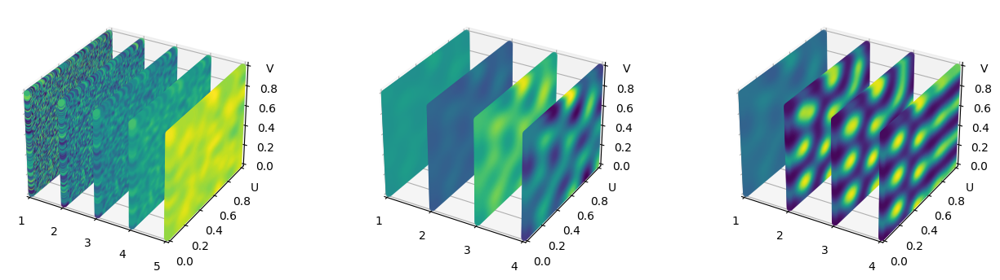

In [177]:
fig = plt.figure(figsize=(16,4))
plot_heatmap_3d(pq.read_table(datas[6])['u'].to_numpy().reshape((-1,101,101))[:30:6],fig=fig, t=(1,3,1))
plot_heatmap_3d(pq.read_table(datas[6])['u'].to_numpy().reshape((-1,101,101))[30:38:2],fig=fig, t=(1,3,2))
plot_heatmap_3d(pq.read_table(datas[6])['u'].to_numpy().reshape((-1,101,101))[36:52:4],fig=fig, t=(1,3,3))
plt.tight_layout()
plt.show()

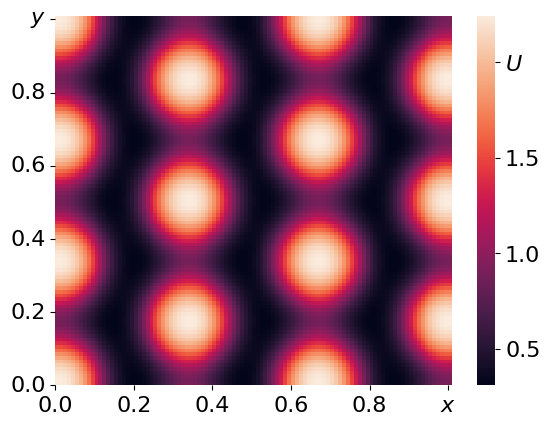

In [272]:
plt.rcParams['font.size'] = 16
ax = sns.heatmap(
    pq.read_table(datas[15])['u'].to_numpy().reshape((-1,101,101))[-1],  
    cbar_kws={'ticks': [round(x/2,2) for x in range(5)]})
ax.collections[0].colorbar.set_ticklabels([str(round(x/2,2)) for x in range(4)]+['$U$'])
ax.set_xticks(range(0,101,20))
ax.set_xticklabels([str(round(x/100, 1)) for x in range(0,100,20)]+ ['$x$'], rotation=0)
ax.set_yticks(range(0,101,20))
ax.set_yticklabels([str(round(x/100, 1)) for x in range(0,100,20)]+ ['$y$'])
ax.invert_yaxis()

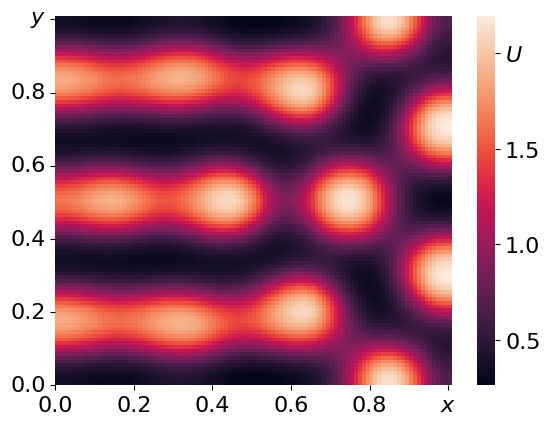

In [217]:
ax = sns.heatmap(
    pq.read_table(datas[31])['u'].to_numpy().reshape((-1,101,101))[-1],  
    cbar_kws={'ticks': [round(x/2,2) for x in range(5)]})
ax.collections[0].colorbar.set_ticklabels([str(round(x/2,2)) for x in range(4)]+['$U$'])
ax.set_xticks(range(0,101,20))
ax.set_xticklabels([str(round(x/100, 1)) for x in range(0,100,20)]+ ['$x$'], rotation=0)
ax.set_yticks(range(0,101,20))
ax.set_yticklabels([str(round(x/100, 1)) for x in range(0,100,20)]+ ['$y$'])
ax.invert_yaxis()

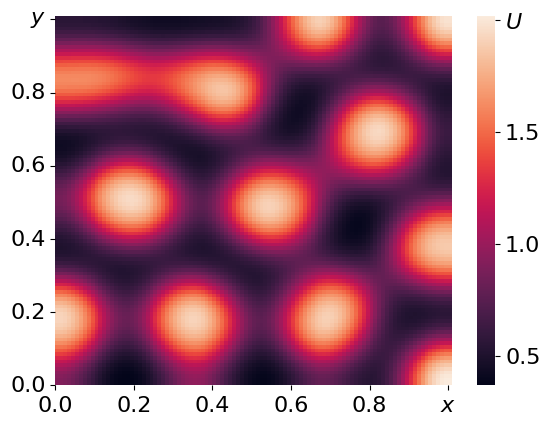

In [223]:
ax = sns.heatmap(
    pq.read_table(datas[85])['u'].to_numpy().reshape((-1,101,101))[-1],  
    cbar_kws={'ticks': [round(x/2,2) for x in range(5)]})
ax.collections[0].colorbar.set_ticklabels([str(round(x/2,2)) for x in range(4)]+['$U$'])
ax.set_xticks(range(0,101,20))
ax.set_xticklabels([str(round(x/100, 1)) for x in range(0,100,20)]+ ['$x$'], rotation=0)
ax.set_yticks(range(0,101,20))
ax.set_yticklabels([str(round(x/100, 1)) for x in range(0,100,20)]+ ['$y$'])
ax.invert_yaxis()

In [301]:
import json
d = pq.read_table(datas[6])['u'].to_numpy().reshape((-1,101*101))
meta = json.load(open('/media/alexander/BigDisk/data/selk_strogg_2D_2023_04_30_long_2/0.0625_1.0_17/configs.json'))

In [302]:
time = np.array(meta['method_conf']['save_timeline_points']) * meta['method_conf']['d_t']
time

array([2.0e-03, 4.0e-03, 6.0e-03, 8.0e-03, 1.0e-02, 1.2e-02, 1.4e-02,
       1.6e-02, 1.8e-02, 2.0e-02, 4.0e-02, 6.0e-02, 8.0e-02, 1.0e-01,
       1.2e-01, 1.4e-01, 1.6e-01, 1.8e-01, 2.0e-01, 4.0e-01, 6.0e-01,
       8.0e-01, 1.0e+00, 1.2e+00, 1.4e+00, 1.6e+00, 1.8e+00, 2.0e+00,
       4.0e+00, 6.0e+00, 8.0e+00, 1.0e+01, 1.2e+01, 1.4e+01, 1.6e+01,
       1.8e+01, 2.0e+01, 4.0e+01, 6.0e+01, 8.0e+01, 1.0e+02, 1.2e+02,
       1.4e+02, 1.6e+02, 1.8e+02, 2.0e+02, 4.0e+02, 6.0e+02, 8.0e+02,
       1.0e+03, 1.2e+03, 1.4e+03, 1.6e+03, 1.8e+03, 2.0e+03, 2.2e+03,
       2.4e+03, 2.6e+03, 2.8e+03, 3.0e+03, 3.2e+03, 3.4e+03, 3.6e+03,
       3.8e+03, 4.0e+03, 4.2e+03, 4.4e+03, 4.6e+03, 4.8e+03, 5.0e+03,
       5.2e+03, 5.4e+03, 5.6e+03, 5.8e+03, 6.0e+03, 6.2e+03, 6.4e+03,
       6.6e+03, 6.8e+03, 7.0e+03, 7.2e+03, 7.4e+03, 7.6e+03, 7.8e+03,
       8.0e+03, 8.2e+03, 8.4e+03, 8.6e+03, 8.8e+03, 9.0e+03, 9.2e+03,
       9.4e+03, 9.6e+03, 9.8e+03])

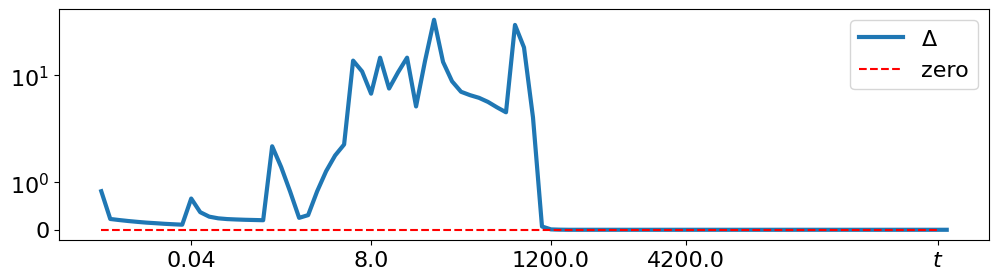

In [305]:
fig = plt.figure(figsize=(12,3))
ax = plt.gca()
tcks = [10,30,50,70, 93]
ax.plot(np.apply_along_axis(np.linalg.norm, -1, d[1:] - d[:-1]), lw=3, label = '$\Delta$')
ax.set_xticks(tcks)
ax.set_xticklabels([str(x) for x in time[tcks][:-1]] + ['$t$'])
ax.hlines(0,0,93, color='r',linestyles='--', label='zero')
ax.set_yscale('symlog')
plt.legend()
plt.show()

In [267]:
datas[6]

'/media/alexander/BigDisk/data/selk_strogg_2D_2023_04_30_long_2/0.0025_1.0_14/process.parquet'

In [280]:
d_1 = pq.read_table(datas[6])['u'].to_numpy().reshape((-1,101,101))
meta_1 = json.load(open('/media/alexander/BigDisk/data/selk_strogg_2D_2023_04_30_long_2/0.0025_1.0_14/configs.json'))
time_1 = np.array(meta['method_conf']['save_timeline_points']) * meta['method_conf']['d_t']
time_1

array([2.0e-03, 4.0e-03, 6.0e-03, 8.0e-03, 1.0e-02, 1.2e-02, 1.4e-02,
       1.6e-02, 1.8e-02, 2.0e-02, 4.0e-02, 6.0e-02, 8.0e-02, 1.0e-01,
       1.2e-01, 1.4e-01, 1.6e-01, 1.8e-01, 2.0e-01, 4.0e-01, 6.0e-01,
       8.0e-01, 1.0e+00, 1.2e+00, 1.4e+00, 1.6e+00, 1.8e+00, 2.0e+00,
       4.0e+00, 6.0e+00, 8.0e+00, 1.0e+01, 1.2e+01, 1.4e+01, 1.6e+01,
       1.8e+01, 2.0e+01, 4.0e+01, 6.0e+01, 8.0e+01, 1.0e+02, 1.2e+02,
       1.4e+02, 1.6e+02, 1.8e+02, 2.0e+02, 4.0e+02, 6.0e+02, 8.0e+02,
       1.0e+03, 1.2e+03, 1.4e+03, 1.6e+03, 1.8e+03, 2.0e+03, 2.2e+03,
       2.4e+03, 2.6e+03, 2.8e+03, 3.0e+03, 3.2e+03, 3.4e+03, 3.6e+03,
       3.8e+03, 4.0e+03, 4.2e+03, 4.4e+03, 4.6e+03, 4.8e+03, 5.0e+03,
       5.2e+03, 5.4e+03, 5.6e+03, 5.8e+03, 6.0e+03, 6.2e+03, 6.4e+03,
       6.6e+03, 6.8e+03, 7.0e+03, 7.2e+03, 7.4e+03, 7.6e+03, 7.8e+03,
       8.0e+03, 8.2e+03, 8.4e+03, 8.6e+03, 8.8e+03, 9.0e+03, 9.2e+03,
       9.4e+03, 9.6e+03, 9.8e+03])

/tmp/ipykernel_41790/3184931306.py:15: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


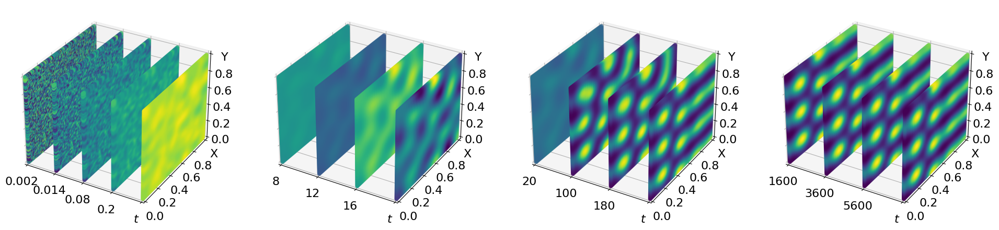

In [299]:
plt.rcParams['font.size'] = 16
fig = plt.figure(figsize=(24,8))
ax = plot_heatmap_3d(d_1[:30:6],fig=fig, t=(1,4,1))
ax.set_xticks(range(5))
ax.set_xticklabels([str(round(x,3)) for x in time_1[:30:6][:-1]] + ['$t$'])
ax = plot_heatmap_3d(d_1[30:38:2],fig=fig, t=(1,4,2))
ax.set_xticks(range(4))
ax.set_xticklabels([str(round(x)) for x in time_1[30:38:2][:-1]] + ['$t$'])
ax = plot_heatmap_3d(d_1[36:52:4],fig=fig, t=(1,4,3))
ax.set_xticks(range(4))
ax.set_xticklabels([str(round(x)) for x in time_1[36:52:4][:-1]] + ['$t$'])
ax = plot_heatmap_3d(d_1[52:92:10],fig=fig, t=(1,4,4))
ax.set_xticks(range(4))
ax.set_xticklabels([str(round(x)) for x in time_1[52:92:10][:-1]] + ['$t$'])
plt.tight_layout()
plt.show()

In [78]:
ex_norm =np.apply_along_axis(lambda x: (x - x.min())/x.max(), -1,ex)

<Axes3DSubplot: >

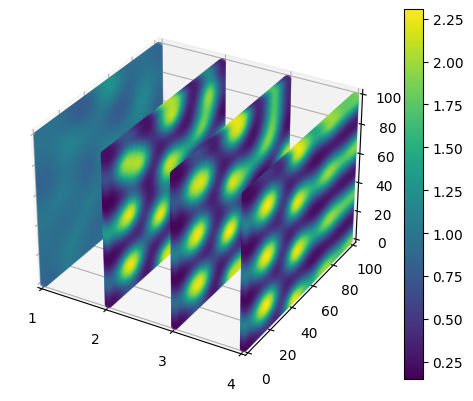

In [109]:
plot_heatmap_3d(ex[36:52:4], show_colorbar=True)